<a href="https://colab.research.google.com/github/Wupadova/Cognitive-Behavial-and-Social-Data/blob/main/Cognitive.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

##Libraries

In [ ]:
#Generical libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import time
import itertools
from prettytable import PrettyTable
from google.colab import drive
import math

#ignore warnings
import warnings
warnings.filterwarnings('ignore')

#Loading, preprocessing and splitting the dataset
from urllib.request import urlopen
from collections import Counter
from sklearn.utils import shuffle
from sklearn.model_selection import train_test_split
from sklearn.model_selection import cross_val_score
from sklearn.model_selection import StratifiedKFold
from sklearn.preprocessing import Normalizer
from sklearn.preprocessing import StandardScaler

#Perceptron 
from sklearn.linear_model import Perceptron
from sklearn.multiclass import OneVsOneClassifier

#Decision Tree and Random Forest
from sklearn.model_selection import GridSearchCV
from sklearn import tree
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay 

#Support Vector Machine (SVM)
from sklearn import svm
from sklearn.svm import LinearSVC

#Neural Network (NN)
from xgboost import XGBClassifier

#Feature selection
from sklearn.feature_selection import SelectFromModel
from sklearn.feature_selection import VarianceThreshold
from sklearn.inspection import permutation_importance
from sklearn.feature_selection import RFE
from sklearn.feature_selection import RFECV

#Logistic Regression
from sklearn.linear_model import LogisticRegression

#K-Nearest Neighbour (kNN)
from sklearn.neighbors import KNeighborsClassifier

#Optuna hyperparameter tuning
!pip install optuna
import optuna as op
from optuna.visualization import plot_contour, plot_parallel_coordinate
from optuna.visualization import plot_optimization_history

#PCA
from sklearn.decomposition import PCA

#SelectKBest
#from sklearn.datasets import load_digits
from sklearn.feature_selection import SelectKBest, chi2

#Metrics
from sklearn.metrics import f1_score
from sklearn.metrics import accuracy_score
from sklearn.metrics import precision_score
from sklearn.metrics import recall_score
from sklearn.metrics import roc_curve
from sklearn.metrics import roc_auc_score

#set random seed
import random
random.seed(42)

import seaborn as sns

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 348.5/348.5 KB 13.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 81.0/81.0 KB 11.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 210.6/210.6 KB 24.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 KB 11.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 50.0/50.0 KB 6.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 147.1/147.1 KB 18.9 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 112.7/112.7 KB 15.0 MB/s eta 0:00:00
  Created wheel for pyperclip: filename=pyperclip-1.8.2-py3-none-any.whl size=11136 sha256=dac602758263ba2436444cc3019a3b1347f3c88840d0e2d5c25d54b588473d84
  Stored in directory: /root/.cache/pip/wheels/7f/1a/65/84ff8c386bec21fca6d220ea1f5498a0367883a78dd5ba6122
Successfully built pyperclip
  

# Loading and preprocessing data

##Loading Data

In [ ]:
from google.colab import drive
drive.mount('/content/drive', force_remount = True)

Mounted at /content/drive


In [ ]:
#import datasets
df_1 = pd.read_csv("/content/drive/MyDrive/DFCognitive/df_1.csv")
df_2 = pd.read_csv("/content/drive/MyDrive/DFCognitive/df_2.csv")
df_3 = pd.read_csv("/content/drive/MyDrive/DFCognitive/df_3.csv")
df_4 = pd.read_csv("/content/drive/MyDrive/DFCognitive/df_4.csv")
df_5 = pd.read_csv("/content/drive/MyDrive/DFCognitive/df_5.csv")
df_6 = pd.read_csv("/content/drive/MyDrive/DFCognitive/df_6.csv")
df_7 = pd.read_csv("/content/drive/MyDrive/DFCognitive/df_7.csv")
df_8 = pd.read_csv("/content/drive/MyDrive/DFCognitive/df_8.csv")
df_9 = pd.read_csv("/content/drive/MyDrive/DFCognitive/df_9.csv")
df_10 = pd.read_csv("/content/drive/MyDrive/DFCognitive/df_10.csv")
df_11 = pd.read_csv("/content/drive/MyDrive/DFCognitive/df_11.csv")
df_12 = pd.read_csv("/content/drive/MyDrive/DFCognitive/df_12.csv")
df_13 = pd.read_csv("/content/drive/MyDrive/DFCognitive/df_13.csv")

In [ ]:
#Defining a list of df in order to iterate on them 
df_list = [df_1, df_2, df_3, df_4,df_5, df_6, df_7, 
           df_8, df_9,  df_11, df_12, df_13]
df_list_10 = [df_10]  # Only the dataset 10

##Exploring our datasets

In [ ]:
for df in df_list:
  print('Another dataset')
  print('Data shape')
  print(df.shape) #data shape
  print('Data head')
  print(df.head(5)) #display first 5 columns
  print('Data types')
  print(df.dtypes) #data types
  print('Description of dataset')
  print(df.describe()) # return analysis of each numerical value

Another dataset
Data shape
(1346, 28)
Data head
   Mach1   Mach2   Mach3   Mach4   Mach5   Mach6   Mach7   Mach8   Mach9   \
0       3       1       1       4       2       3       4       2       4   
1       5       4       2       5       2       5       5       3       2   
2       3       2       2       4       1       4       3       2       2   
3       2       4       4       3       2       4       3       3       2   
4       4       3       1       1       2       1       2       5       2   

   Psycho1   ...  Narc1   Narc2   Narc3   Narc4   Narc5   Narc6   Narc7   \
0         2  ...       1       1       2       1       2       1       1   
1         2  ...       2       3       1       1       3       2       1   
2         2  ...       2       2       2       1       2       1       3   
3         2  ...       5       4       2       2       4       4       4   
4         3  ...       4       3       1       1       5       1       3   

   Narc8   Narc9   CONDITION  
0

##Cleaning data

In [ ]:
#function to extract the pointer's name
def get_var_name(variable):
    globals_dict = globals()
    return [var_name for var_name in globals_dict if globals_dict[var_name] is variable]

In [ ]:
#Counting NA values in each dataframe
for df in df_list:
  print (f'The dataframe {get_var_name(df)[0]} has {df.isna().sum().sum()} NA values out of {df.size} elements')

The dataframe df_1 has 0 NA values out of 37688 elements
The dataframe df_2 has 0 NA values out of 23868 elements
The dataframe df_3 has 0 NA values out of 8442 elements
The dataframe df_4 has 0 NA values out of 16376 elements
The dataframe df_5 has 0 NA values out of 19006 elements
The dataframe df_6 has 0 NA values out of 182104 elements
The dataframe df_7 has 0 NA values out of 26988 elements
The dataframe df_8 has 0 NA values out of 12882 elements
The dataframe df_9 has 0 NA values out of 8234 elements
The dataframe df_11 has 0 NA values out of 12818 elements
The dataframe df_12 has 0 NA values out of 4500 elements
The dataframe df_13 has 0 NA values out of 15268 elements


In [ ]:
#data cleaning
for l in df_list:
  l.dropna() #dropping NA values

##Preprocessing and splitting function


In [ ]:
def split(df):
  
  # split into dependent and independent sets
  X, y = df.iloc[:, :-1].values, df.iloc[:, -1].values

  # Change response to binary 0 and 1
  np.place(y, y=='H', 1)
  np.place(y, y=='D', 0)

  #splitting the original dataset
  X_train , X_test, y_train , y_test = train_test_split(X,y, test_size=0.2, random_state=42)

  #Scaling the dataset
  scaler=Normalizer().fit(X_train)
  X_train=scaler.transform(X_train)
  X_test=scaler.transform(X_test)

  #we change type from 'object' to 'int' so that our study recognizes it
  y_train=y_train.astype('int')
  y_test=y_test.astype('int')
  return X, y, X_train , X_test, y_train , y_test 

#X_train , X_test, y_train , y_test = split(df) 

# Defining modelling, evaluation and selection functions

## Defining objectives for our models



In [ ]:
#SVM tuning 
def objective_SVM(trial):
    kernel=trial.suggest_categorical('kernel',['poly','linear','sigmoid','rbf'])
    c=trial.suggest_float("C",0.1,5.0,log=True)
    gamma=trial.suggest_categorical('gamma',['auto','scale'])
    degree=trial.suggest_int("degree",1,3,log=True)
    #probability = trial.set_user_attr("probability",True)
    m =svm.SVC(kernel=kernel,degree=degree,gamma=gamma,C=c, probability = True)
    m.fit(X_train,y_train)
    return accuracy_score(y_train, m.predict(X_train))

#K-NN tuning
def objective_KNN(trial):
    n_neighbors = trial.suggest_int("n_neighbors", 3, 20)
   # weights = trial.suggest_categorical("weights", ['uniform', 'distance'])
   # metric = trial.suggest_categorical("metric", ['euclidean', 'manhattan', 'minkowski'])
    m = KNeighborsClassifier(n_neighbors=n_neighbors)
    m.fit(X_train,y_train)
    return accuracy_score(y_train, m.predict(X_train))
#RF tuning
def objective_RF(trial):
    n_estimators = trial.suggest_int('n_estimators', 2, 500)
    max_depth = float(int(trial.suggest_loguniform('max_depth', 1, 32)))
    #min_samples_split = int(trial.suggest_loguniform('min_samples_split', 2, 10))
    m = RandomForestClassifier(n_estimators=n_estimators, max_depth=max_depth)
    m.fit(X_train,y_train)
    return accuracy_score(y_train, m.predict(X_train))

#Tree tuning
def objective_T(trial):
    max_depth = trial.suggest_int('max_depth', 3, 100)
    min_samples_split = trial.suggest_int('min_samples_split', 2, 20)
    min_samples_leaf = trial.suggest_int('min_samples_leaf', 1, 30)
    m = DecisionTreeClassifier(max_depth=max_depth, min_samples_split=min_samples_split,
                               min_samples_leaf=min_samples_leaf)
    m.fit(X_train,y_train)
    return accuracy_score(y_train, m.predict(X_train))
#XGB classifier NN model
def objective_XGB(trial):
    params = {
        'max_depth': trial.suggest_int('max_depth', 1, 9),
        'learning_rate': trial.suggest_loguniform('learning_rate', 0.01, 1.0),
        'n_estimators': trial.suggest_int('n_estimators', 50, 500),
        'min_child_weight': trial.suggest_int('min_child_weight', 1, 10),
        'gamma': trial.suggest_loguniform('gamma', 1e-8, 1.0),
        'subsample': trial.suggest_loguniform('subsample', 0.01, 1.0),
        'colsample_bytree': trial.suggest_loguniform('colsample_bytree', 0.01, 1.0),
        'reg_alpha': trial.suggest_loguniform('reg_alpha', 1e-8, 1.0),
        'reg_lambda': trial.suggest_loguniform('reg_lambda', 1e-8, 1.0),
        'eval_metric': 'mlogloss',
        'use_label_encoder': False
    }
    m = XGBClassifier(**params)
    m.fit(X_train, y_train)
    return accuracy_score(y_train, m.predict(X_train))

## Modelling function

In [ ]:
from sklearn.tree import DecisionTreeClassifier

#Modelling function
def modelling(model, X_train, X_val, y_train, y_val, hyper = None,  tuning = False, flow = False, n = None):
  
#decide later on what plots to show for tuning and read about types of samplers
  if tuning == True:
    study = op.create_study(direction="maximize")
    if model=='KNN':
      study.optimize(objective_KNN, n_trials = n ,n_jobs = -1) #number of trials and n_jobs is for parralelization
    if model == 'SVM':
      study.optimize(objective_SVM, n_trials = n,n_jobs = -1) #number of trials and n_jobs is for parralelization
    if model == "Tree":
      study.optimize(objective_T, n_trials = n ,n_jobs = -1) #number of trials and n_jobs is for parralelization
    if model == "RF":
      study.optimize(objective_RF, n_trials = n,n_jobs = -1) #number of trials and n_jobs is for parralelization
    if model == "XGB":
      study.optimize(objective_XGB, n_trials=n, n_jobs = -1)
    plot_optimization_history(study)
    best= study.best_trial
    hyper = best.params   
    plot_parallel_coordinate(study).show()  
    plot_contour(study).show()
  #Model training 
  if model=='KNN':
    m = KNeighborsClassifier(**hyper)
  if model == 'SVM':
    m = svm.SVC(**hyper, probability = True)  
  if model == "Tree":
    m = tree.DecisionTreeClassifier(random_state=123,criterion='entropy', **hyper) 
  if model == "RF":
    m = RandomForestClassifier(random_state=123,criterion='entropy', **hyper)
  if model == "XGB":
    m = XGBClassifier(random_state = 123, **hyper)
  if flow == True: 
    #fit and predict with model  
    m.fit(X_train,y_train)
    y_pred = m.predict(X_val)
    #calculate probabilities
    y_prob = m.predict_proba(X_val)[:, 1]

    return y_val, y_pred, y_prob
  if flow == False:
    return m, hyper

## Evaluation function

In [ ]:
#model evaluation
def evaluation(y_test,y_pred,y_prob=None):
  # Model Accuracy
  print("Accuracy:",accuracy_score(y_test, y_pred))
  #Precision
  print("Precision:",precision_score(y_test, y_pred))
  #Recall
  print("Recall:",recall_score(y_test, y_pred))
  #Confusion matrix
  cf =confusion_matrix(y_test,y_pred)
  plt.matshow(cf)
  plt.title('Confusion Matrix Plot')
  plt.colorbar()
  plt.xlabel('Precited')
  plt.ylabel('Actual')
  plt.show();
  #ROC curve and AUC score

  #roc curve calculation
  fpr, tpr, thresholds = roc_curve(y_test, y_prob)
  #auc calculation
  auc = roc_auc_score(y_test, y_prob)
  print('AUC: %.3f' % auc)
  plt.plot(fpr, tpr, linestyle='--', label='Roc curve')
  plt.xlabel('False Positive Rate')
  plt.ylabel('True Positive Rate')
  plt.legend()
  plt.show()

## Selection function

In [ ]:
#feature selection function 
def selection(s_type, df, n= None):   # n: number of features needed for ALL the models except PCA
  
  #-----------------------------------------------------------------------------------------
  # Get the names of the dataframe, otherwise during splitting phase, we will lose the names
  #-----------------------------------------------------------------------------------------
  names = df.columns.tolist()[:-1] 

  X, y, X_train , X_test, y_train , y_test = split(df)  
  # PCA
  if s_type=='PCA':
    pca = PCA(n_components=5)
    principalComponents = pca.fit_transform(X)
    principalDf = pd.DataFrame(data = principalComponents
             , columns = ['principal component 1', 'principal component 2','principal component 3','principal component 4','principal component 5'])
    print("PCA Explainded variance ratio {}".format(pca.explained_variance_ratio_))
    principalDf['CONDITION']=y
    return principalDf

  if s_type == 'SelectKBest':

    # convert to dataframe
    X = pd.DataFrame(X, columns = names)
    X_train = pd.DataFrame(X_train, columns = names)
    X_test = pd.DataFrame(X_test, columns = names)
    
    sel = SelectKBest(score_func=chi2, k=n)
    sel.fit(X_train, y_train)
    X_train_sel = sel.transform(X_train)
    X_test_sel = sel.transform(X_test)

    selected_features_k_best = sel.get_feature_names_out()  # get the selected names
    mask = sel.get_support()  # get the mask

    coef = sel.scores_[mask, ]  # mask the selected coefficients
    coef_series = pd.Series(coef, index=selected_features_k_best) # change to panda series

    coef_series_abs = coef_series.abs()  # take the absolute value
    coef_series_abs.sort_values(ascending = False, inplace=True)  # inplace sorting
    
    top_20_selected = coef_series_abs.index  # top 20% most relavant features

    return X_train_sel, X_test_sel, top_20_selected

  if s_type == 'LOGISTIC_LASSO':
    #---------------------------------------------------------------------------------------------------
    # feature selection by LASSO, linear regression
    # Hyperparameter: alpha(lambda)
    # Note: The input X must be converted to DataFrame first as it is required for the selected features.
    #---------------------------------------------------------------------------------------------------

    #defining a standard scaler
    scaler=StandardScaler().fit(X_train)
    X_train=scaler.transform(X_train)
    X_test=scaler.transform(X_test)

    # convert to dataframe
    X = pd.DataFrame(X, columns = names)
    X_train = pd.DataFrame(X_train, columns = names)
    X_test = pd.DataFrame(X_test, columns = names)
    
    #  select the features with LASSO regularized linear regression
    sel_lasso = SelectFromModel(        
        LogisticRegression(penalty='l1', solver='liblinear', n_jobs=-1, random_state=1)   # L1 regularization
    )
    sel_lasso.fit(X_train, y_train)

    # boolean output for features with non-zero coefficients
    sel_lasso.get_support()  

    # identify the name of the selected features
    selected_features_lasso = X_train.columns[(sel_lasso.estimator_.coef_ != 0).ravel().tolist()]

    coef = sel_lasso.estimator_.coef_[sel_lasso.estimator_.coef_ != 0]  # get the coefficient
    
    coef_series = pd.Series(coef, index=selected_features_lasso) # change to panda series

    coef_series_abs = coef_series.abs()  # take the absolute value
    coef_series_abs.sort_values(ascending = False, inplace=True)  # inplace sorting
    
    top_20_selected = coef_series_abs.index[: n]  # top 20% most relavent features

    # remove the features 
    X_train_selected_lasso = sel_lasso.transform(X_train)
    X_test_selected_lasso = sel_lasso.transform(X_test)

    return X_train_selected_lasso, X_test_selected_lasso, top_20_selected

  if s_type == 'SVM_LASSO':

    #---------------------------------------------------------------------------------------------------
    # feature selection by LASSO, linear regression
    # Hyperparameter: alpha(lambda)
    # Note: The input X must be converted to DataFrame first as it is required for the selected features.
    #---------------------------------------------------------------------------------------------------

    #defining a standard scaler
    scaler=StandardScaler().fit(X_train)
    X_train=scaler.transform(X_train)
    X_test=scaler.transform(X_test)

    # convert to dataframe
    X = pd.DataFrame(X, columns = names)
    X_train = pd.DataFrame(X_train, columns = names)
    X_test = pd.DataFrame(X_test, columns = names)
    
    #  select the features with LASSO regularized linear regression
    sel_lasso = SelectFromModel(        
        LinearSVC(penalty='l1', dual= False, random_state=1)   # L1 regularization
    )
    sel_lasso.fit(X_train, y_train)

    # boolean output for features with non-zero coefficients
    sel_lasso.get_support()  

    # identify the name of the selected features
    selected_features_lasso = X_train.columns[(sel_lasso.estimator_.coef_ != 0).ravel().tolist()]

    coef = sel_lasso.estimator_.coef_[sel_lasso.estimator_.coef_ != 0]  # get the coefficient
    
    coef_series = pd.Series(coef, index=selected_features_lasso) # change to panda series

    coef_series_abs = coef_series.abs()  # take the absolute value
    coef_series_abs.sort_values(ascending = False, inplace=True)  # inplace sorting
    
    top_20_selected = coef_series_abs.index[: n]  # top 20% most relavent features

    # remove the features 
    X_train_selected_lasso = sel_lasso.transform(X_train)
    X_test_selected_lasso = sel_lasso.transform(X_test)

    return X_train_selected_lasso, X_test_selected_lasso, top_20_selected

  if s_type == 'VAR_SEL':
    #----------------------------------------------------------------------------------------------
    # Feature selection by removing columns of low variance.
    #----------------------------------------------------------------------------------------------

    X = pd.DataFrame(X, columns = names)
    X_train = pd.DataFrame(X_train, columns = names)
    X_test = pd.DataFrame(X_test, columns = names)

    # get the variance of the dataframe
    variance = X.var()
    variance.sort_values(ascending = True)[: n]

    selected_features = variance.index.tolist()
    X_train_selected_var = df.loc[: ,selected_features]
    X_test_selected_var = df.loc[:, selected_features]

    return X_train_selected_var, X_test_selected_var, selected_features

  if s_type == 'TAR_SEL': 
    #----------------------------------------------------------------------------------------------
    # Feature selection by selecting the ones that are highly correlated with the target.
    #----------------------------------------------------------------------------------------------
    X = pd.DataFrame(X, columns = names)
    X_train = pd.DataFrame(X_train, columns = names)
    X_test = pd.DataFrame(X_test, columns = names)

    selected_features_tar = np.asarray(abs(X.corr().iloc[ :X.shape[1] - 2, -1]).sort_values(ascending = False).keys()[: n].tolist())  # get the first n most relavent features
    
    X_train_selected_tar = X_train.loc[:, selected_features_tar]
    X_test_selected_tar = X_test.loc[:, selected_features_tar]
    
    return X_train_selected_tar, X_test_selected_tar, selected_features_tar

## Permutation feature importance

In [ ]:
def permutation_imp(model, dataset, perc_items): #model = SVM, KNN, Tree, RF ; dataset = df , perc_items = 0.2 

  ''' 
  Return a set with a given percentage of best features selected by importance
  '''

  if perc_items < 0 or perc_items > 1:
    print("Invalid number of best items: percentage needs to range between 0 and 1 ")
  
  elif perc_items == 0:
    print("No features selected")

  elif perc_items == 1:
    print("No feature selection performed")

  else:
    num_best_items = math.ceil(dataset.shape[1]*perc_items)

    model.fit(X_train, y_train)
    
    result = permutation_importance(
    estimator=model, 
    X=X_test,
    y=y_test,
    scoring='accuracy',
    n_repeats=50,
    random_state=0
    )
    
    #indices = np.argsort(result['importances_mean'])[::-1]
    indices = result.importances_mean.argsort()[::-1][:num_best_items]
    best_feat_name = dataset.columns[indices]
    best_feat_score = result['importances_mean'][indices]

  return best_feat_name, best_feat_score

In [ ]:
def compare(x,y):
  return print("The Pearson's correlation coefficient between selected features is {}".format(stats.pearsonr(x, y)[0]))

# Testing 

## SNS plots

PLOT THE DF: df_1


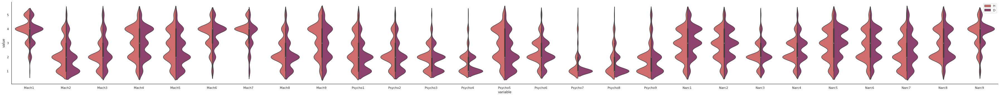

PLOT THE DF: df_2


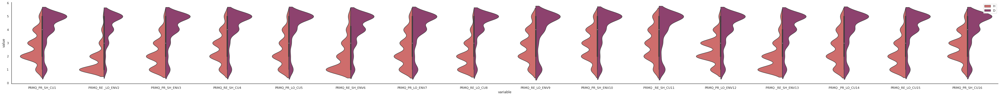

PLOT THE DF: df_3


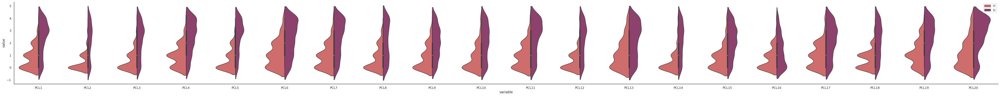

PLOT THE DF: df_4


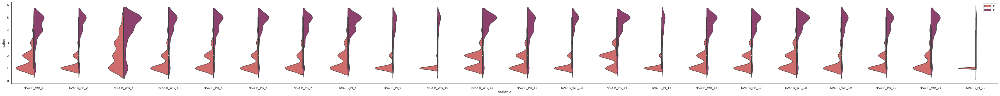

PLOT THE DF: df_5


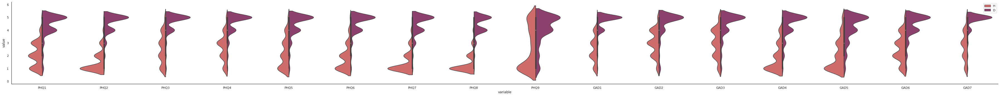

PLOT THE DF: df_6


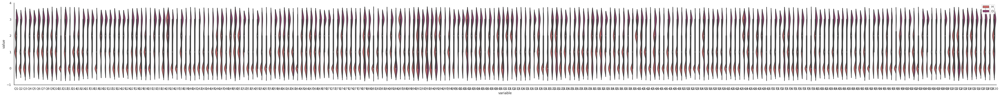

PLOT THE DF: df_7


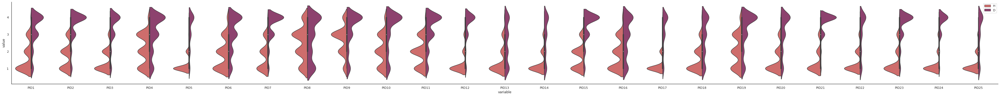

PLOT THE DF: df_8


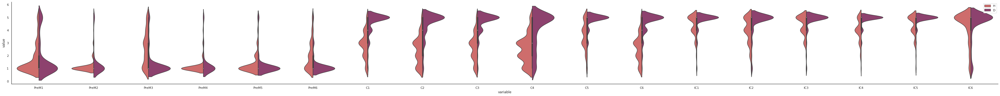

PLOT THE DF: df_9


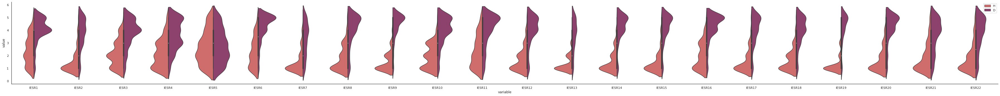

PLOT THE DF: df_10


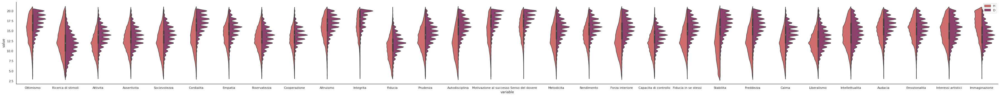

PLOT THE DF: df_11


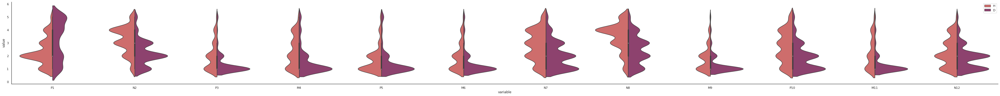

PLOT THE DF: df_12


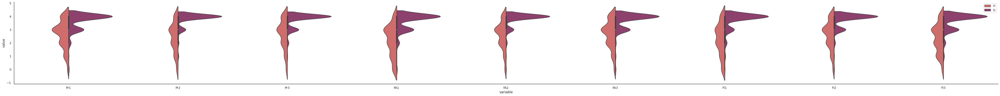

PLOT THE DF: df_13


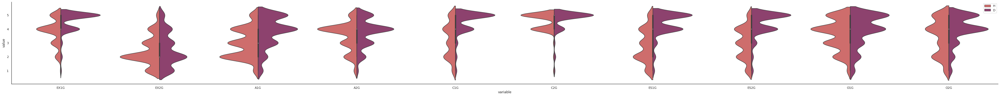

In [ ]:
for df in [df_1,df_2,df_3,df_4,df_5,df_6,df_7,df_8, df_9, df_10, df_11, df_12, df_13]: 
  print("PLOT THE DF: {}".format(get_var_name(df)[0]))
  sns.set(rc={'figure.figsize':(50,5)})
  df_long = df.melt(id_vars=['CONDITION'], value_vars=list(df.columns))
  sns.set_style('white')
  ax = sns.violinplot(data=df_long.iloc[:, :10], x='variable', y='value', hue='CONDITION', split=True, palette='flare')
  ax.legend()
  sns.despine()
  plt.tight_layout()
  plt.show()

## Testing the modelling function

### Testing modelling function from df_1 to df_8

TESTING ON THE DF df_1


Accuracy for KNNis 0.6259259259259259
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for Treeis 0.5555555555555556
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for RFis 0.6222222222222222
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for SVMis 0.6444444444444445
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for XGBis 0.5814814814814815
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model KNN are (Index(['Psycho5 ', 'Mach5 ', 'Narc7 ', 'Mach3 ', 'Narc6 ', 'Psycho1 '], dtype='object'), array([0.02822222, 0.02592593, 0.02533333, 0.02377778, 0.0222963 ,
       0.02222222]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model Tree are (Index(['Mach7 ', 'Psycho2 ', 'Psycho8 ', 'Psycho5 ', 'Psycho9 ', 'Narc7 '], dtype='object'), array([0.03259259, 0.03022222, 0.0202963 , 0.01903704, 0.01511111,
       0.00866667]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model RF are (Index(['Mach3 ', 'Psycho5 ', 'Psycho4 ', 'Narc9 ', 'Psycho2 ', 'Mach7 '], dtype='object'), array([0.01237037, 0.01140741, 0.0077037 , 0.00548148, 0.00355556,
       0.00244444]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model SVM are (Index(['Mach3 ', 'Psycho9 ', 'Psycho5 ', 'Narc5 ', 'Psycho1 ', 'Psycho6 '], dtype='object'), array([0.01585185, 0.00948148, 0.00837037, 0.00740741, 0.00518519,
       0.0042963 ]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy: 0.6259259259259259
Precision: 0.671875
Recall: 0.593103448275862


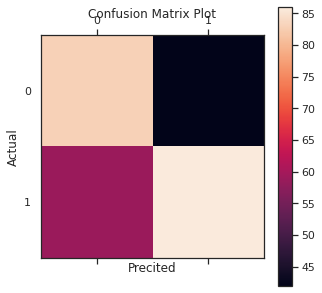

AUC: 0.676


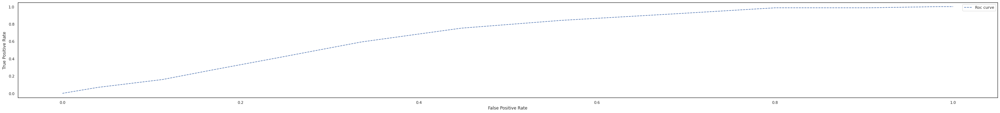

Accuracy: 0.5555555555555556
Precision: 0.5939849624060151
Recall: 0.5448275862068965


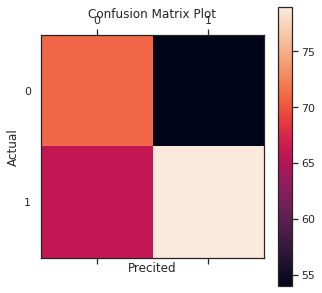

AUC: 0.556


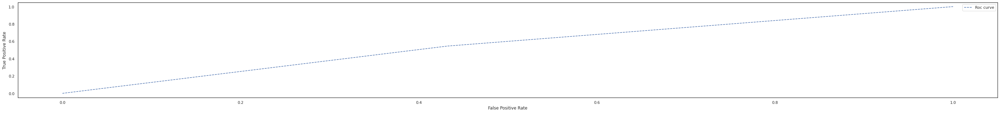

Accuracy: 0.6333333333333333
Precision: 0.6742424242424242
Recall: 0.6137931034482759


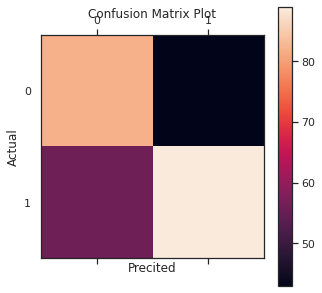

AUC: 0.698


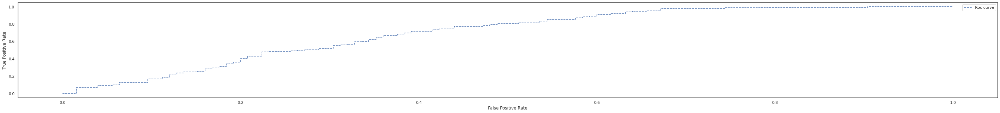

Accuracy: 0.46296296296296297
Precision: 0.0
Recall: 0.0


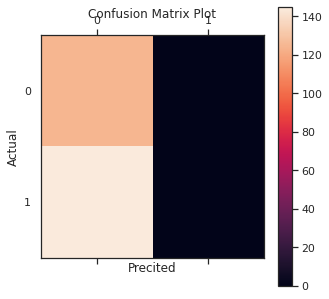

AUC: 0.302


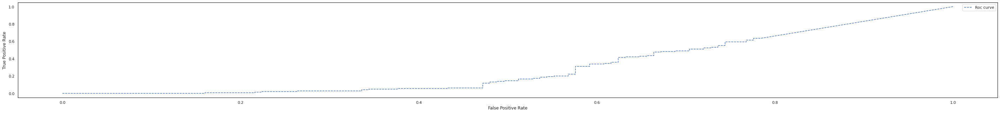

Accuracy: 0.5814814814814815
Precision: 0.6428571428571429
Recall: 0.496551724137931


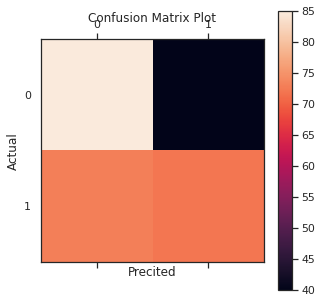

AUC: 0.638


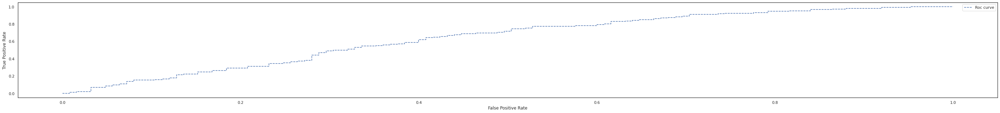

TESTING ON THE DF df_2


Accuracy for KNNis 0.7615658362989324
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for Treeis 0.8327402135231317
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for RFis 0.8718861209964412
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for SVMis 0.8291814946619217
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for XGBis 0.8362989323843416
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model KNN are (Index(['PRMQ_RE _LO_ENV2', 'PRMQ _RE_SH_CU11', 'PRMQ_RE_SH_ENV6',
       'PRMQ_RE_LO_CU8'],
      dtype='object'), array([0.0402847 , 0.03039146, 0.02846975, 0.02170819]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model Tree are (Index(['PRMQ_RE _LO_ENV2', 'PRMQ_RE_LO_CU8', 'PRMQ _RE_SH_ENV13',
       ' PRMQ_PR_SH_ENV3'],
      dtype='object'), array([0.15395018, 0.09380783, 0.08370107, 0.04846975]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model RF are (Index(['PRMQ_RE _LO_ENV2', 'PRMQ_RE_LO_CU8', 'PRMQ _RE_SH_ENV13',
       'PRMQ _RE_SH_CU11'],
      dtype='object'), array([0.0827758 , 0.06854093, 0.05544484, 0.0311032 ]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model SVM are (Index(['PRMQ_RE _LO_ENV2', 'PRMQ _RE_SH_ENV13', 'PRMQ_RE_LO_CU8',
       'PRMQ_PR_LO_CU5'],
      dtype='object'), array([0.09622776, 0.0766548 , 0.05886121, 0.03857651]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy: 0.7615658362989324
Precision: 0.8775510204081632
Recall: 0.6099290780141844


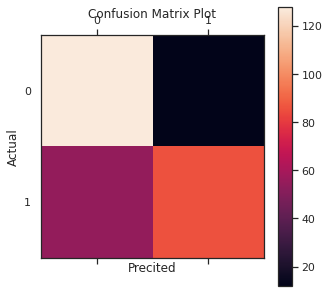

AUC: 0.877


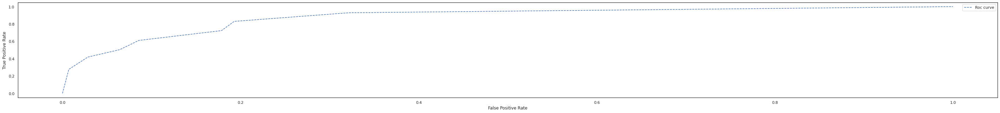

Accuracy: 0.8078291814946619
Precision: 0.8129496402877698
Recall: 0.8014184397163121


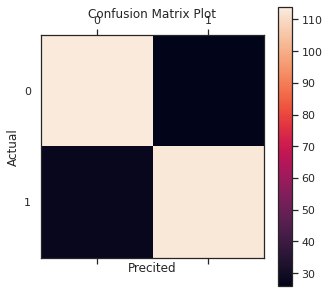

AUC: 0.847


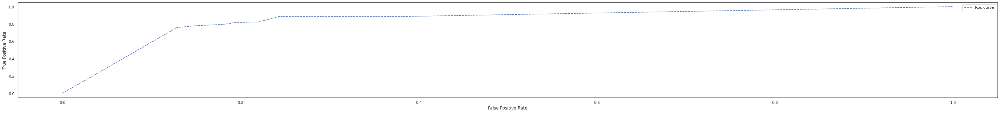

Accuracy: 0.8790035587188612
Precision: 0.8364779874213837
Recall: 0.9432624113475178


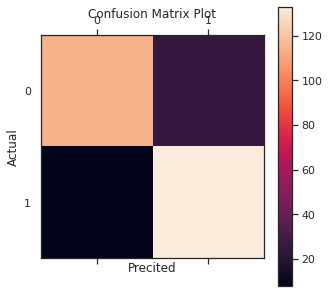

AUC: 0.950


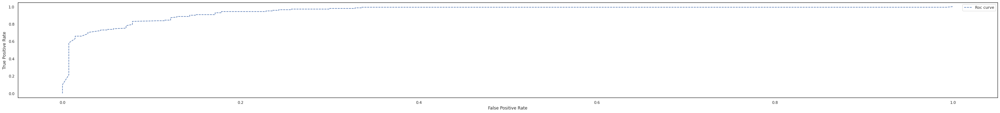

Accuracy: 0.8078291814946619
Precision: 0.84251968503937
Recall: 0.7588652482269503


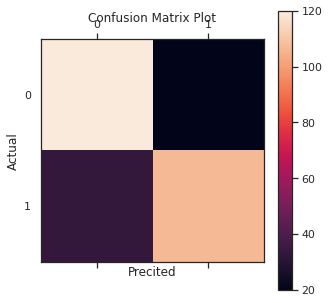

AUC: 0.889


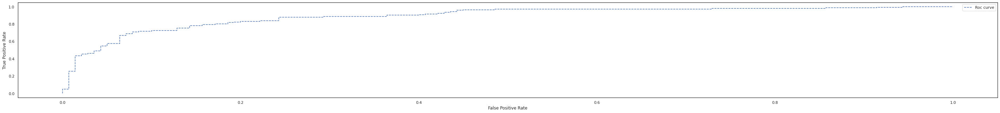

Accuracy: 0.8220640569395018
Precision: 0.8273381294964028
Recall: 0.8156028368794326


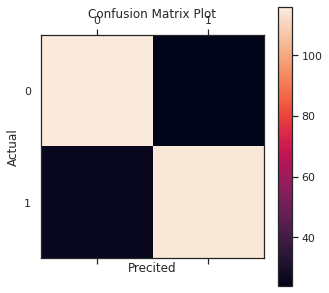

AUC: 0.907


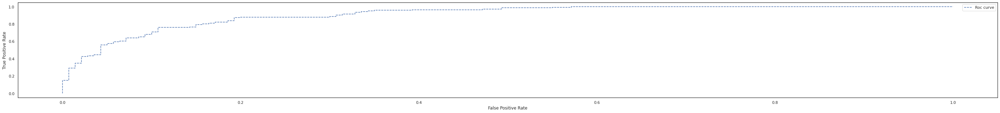

TESTING ON THE DF df_3


Accuracy for KNNis 0.5925925925925926
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for Treeis 0.7407407407407407
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for RFis 0.8518518518518519
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for SVMis 0.7777777777777778
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for XGBis 0.8148148148148148
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model KNN are (Index(['PCL11', 'PCL12', 'PCL17', 'PCL18', 'PCL5'], dtype='object'), array([0.06864198, 0.06049383, 0.06024691, 0.05975309, 0.05283951]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model Tree are (Index(['PCL3', 'PCL14', 'PCL9', 'PCL4', 'PCL5'], dtype='object'), array([0.13160494, 0.07975309, 0.04469136, 0.03111111, 0.0291358 ]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model RF are (Index(['PCL5', 'PCL14', 'PCL1', 'PCL8', 'PCL18'], dtype='object'), array([0.01234568, 0.00567901, 0.00345679, 0.00222222, 0.        ]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model SVM are (Index(['PCL18', 'PCL8', 'PCL12', 'PCL5', 'PCL9'], dtype='object'), array([0.02888889, 0.01555556, 0.01481481, 0.01160494, 0.00740741]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy: 0.5925925925925926
Precision: 0.8333333333333334
Recall: 0.3333333333333333


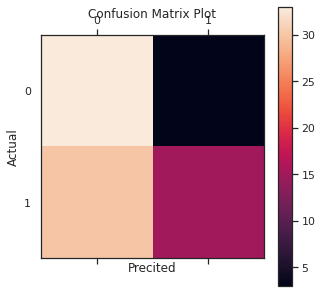

AUC: 0.833


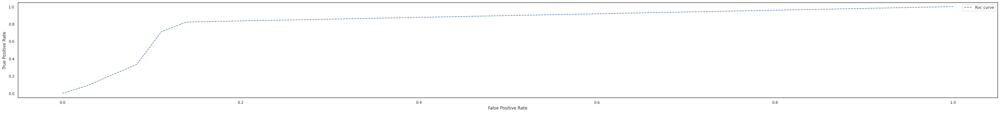

Accuracy: 0.7160493827160493
Precision: 0.8928571428571429
Recall: 0.5555555555555556


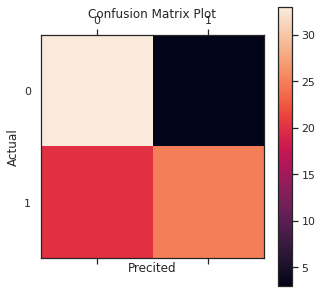

AUC: 0.886


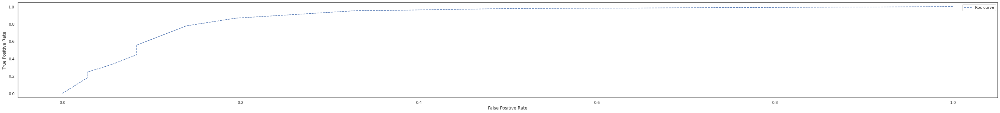

Accuracy: 0.8395061728395061
Precision: 0.9
Recall: 0.8


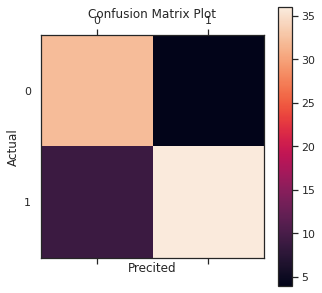

AUC: 0.935


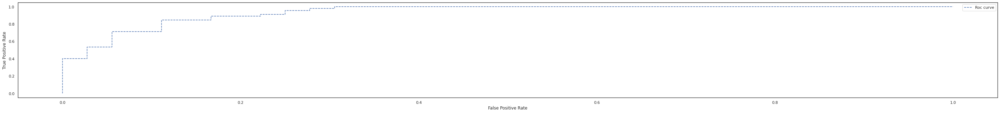

Accuracy: 0.7901234567901234
Precision: 0.9375
Recall: 0.6666666666666666


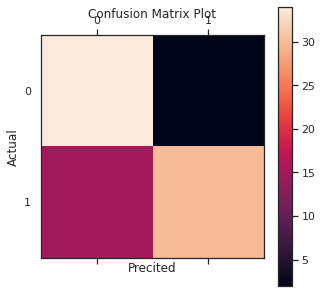

AUC: 0.928


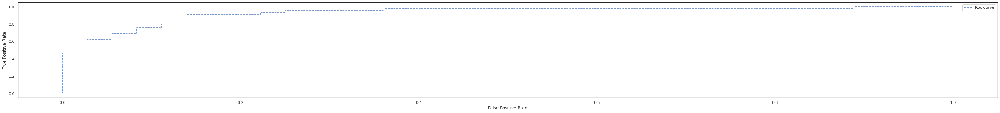

Accuracy: 0.8148148148148148
Precision: 0.8947368421052632
Recall: 0.7555555555555555


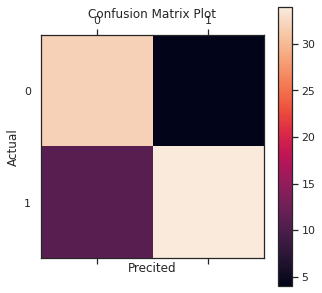

AUC: 0.942


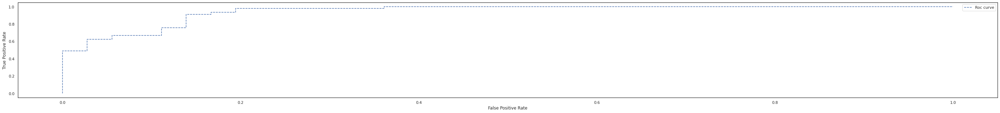

TESTING ON THE DF df_4


Accuracy for KNNis 0.7552447552447552
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for Treeis 0.8951048951048951
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for RFis 0.965034965034965
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for SVMis 0.7622377622377622
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for XGBis 0.9300699300699301
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model KNN are (Index(['NAQ-R_WR_3', 'NAQ-R_WR_18', 'NAQ-R_WR_10', 'NAQ-R_PR_14',
       'NAQ-R_WR_19'],
      dtype='object'), array([ 0.08461538,  0.02013986,  0.01272727,  0.00391608, -0.00097902]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model Tree are (Index(['NAQ-R_WR_3', 'NAQ-R_WR_10', 'NAQ-R_PI_22', 'NAQ-R_WR_16',
       'NAQ-R_WR_13'],
      dtype='object'), array([0.10657343, 0.06853147, 0.05916084, 0.03202797, 0.03034965]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model RF are (Index(['NAQ-R_WR_3', 'NAQ-R_WR_10', 'NAQ-R_WR_13', 'NAQ-R_PR_2', 'NAQ-R_PR_7'], dtype='object'), array([0.04699301, 0.01748252, 0.01188811, 0.00811189, 0.00783217]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model SVM are (Index(['NAQ-R_WR_3', 'NAQ-R_WR_18', 'NAQ-R_PR_14', 'NAQ-R_WR_4', 'NAQ-R_PR_7'], dtype='object'), array([0.07244755, 0.03566434, 0.01902098, 0.01762238, 0.01622378]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy: 0.8251748251748252
Precision: 0.9672131147540983
Recall: 0.7195121951219512


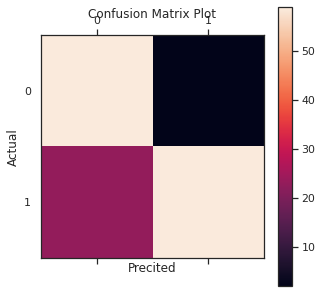

AUC: 0.894


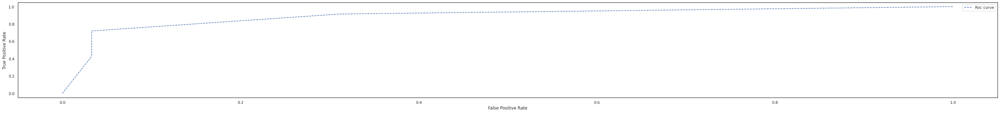

Accuracy: 0.9020979020979021
Precision: 0.9594594594594594
Recall: 0.8658536585365854


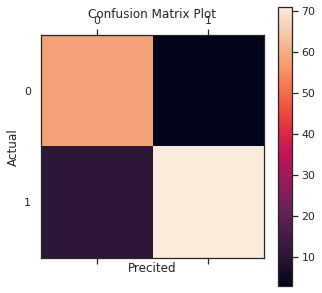

AUC: 0.929


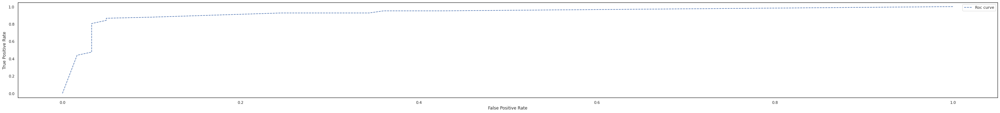

Accuracy: 0.965034965034965
Precision: 0.9753086419753086
Recall: 0.9634146341463414


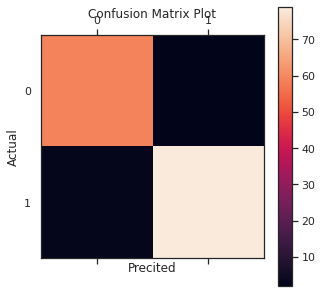

AUC: 0.977


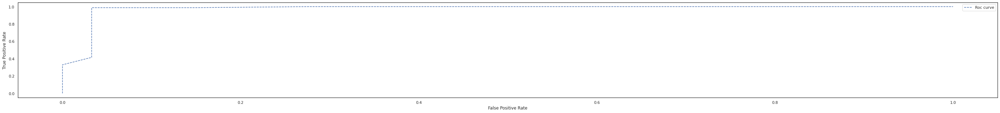

Accuracy: 0.6293706293706294
Precision: 0.967741935483871
Recall: 0.36585365853658536


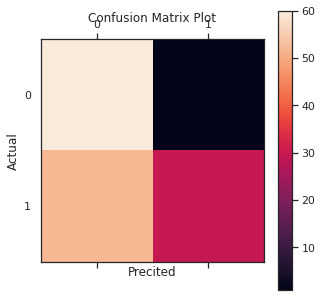

AUC: 0.896


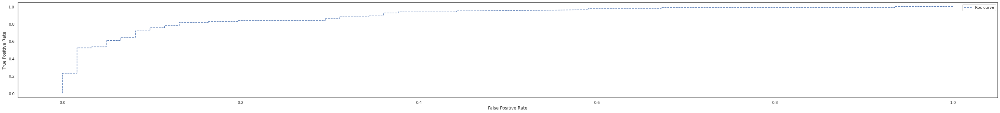

Accuracy: 0.958041958041958
Precision: 0.975
Recall: 0.9512195121951219


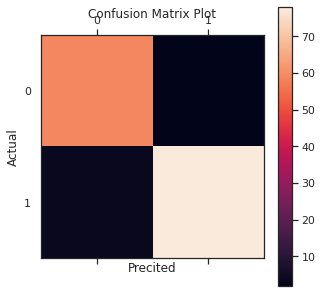

AUC: 0.974


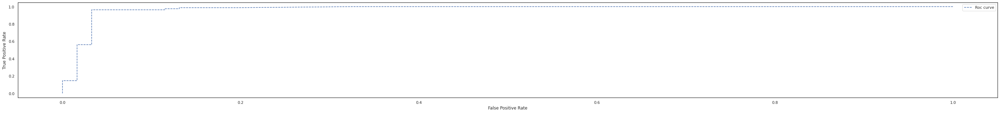

TESTING ON THE DF df_5


Accuracy for KNNis 0.8794642857142857
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for Treeis 0.90625
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for RFis 0.9419642857142857
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for SVMis 0.9598214285714286
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for XGBis 0.96875
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model KNN are (Index(['PHQ2', 'GAD5', 'PHQ8', 'PHQ9'], dtype='object'), array([0.01383929, 0.01267857, 0.01089286, 0.01044643]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model Tree are (Index(['PHQ8', 'PHQ2', 'PHQ7', 'GAD2'], dtype='object'), array([0.07741071, 0.05991071, 0.05544643, 0.04785714]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model RF are (Index(['PHQ8', 'PHQ2', 'PHQ7', 'GAD3'], dtype='object'), array([0.06508929, 0.04160714, 0.02821429, 0.01598214]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model SVM are (Index(['PHQ8', 'PHQ7', 'PHQ2', 'PHQ6'], dtype='object'), array([0.13196429, 0.08830357, 0.08303571, 0.03205357]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy: 0.8928571428571429
Precision: 0.9795918367346939
Recall: 0.8135593220338984


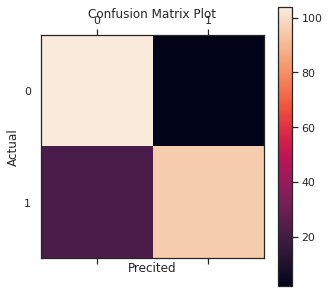

AUC: 0.981


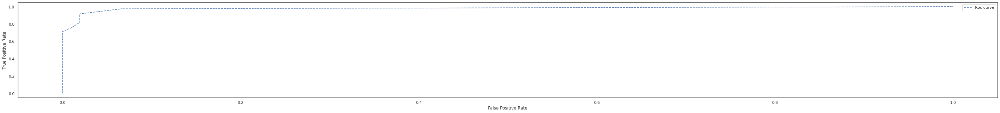

Accuracy: 0.9017857142857143
Precision: 0.9210526315789473
Recall: 0.8898305084745762


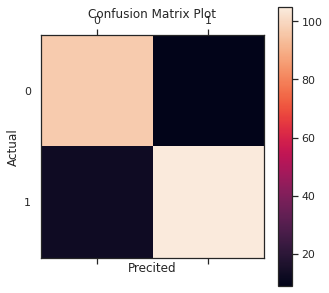

AUC: 0.941


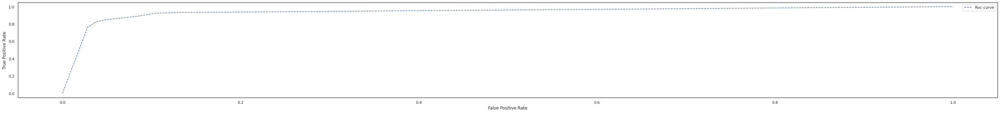

Accuracy: 0.9732142857142857
Precision: 0.9827586206896551
Recall: 0.9661016949152542


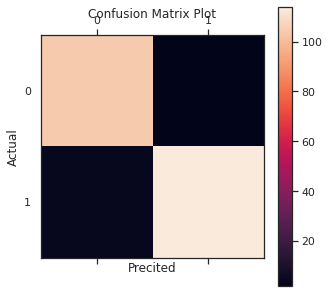

AUC: 0.997


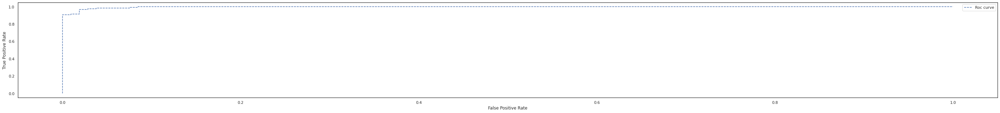

Accuracy: 0.90625
Precision: 0.98989898989899
Recall: 0.8305084745762712


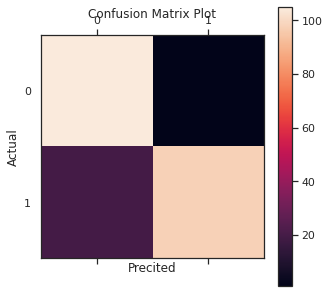

AUC: 0.986


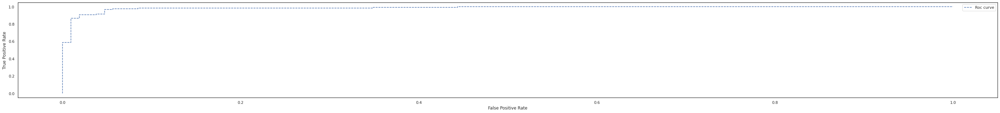

Accuracy: 0.9776785714285714
Precision: 0.9747899159663865
Recall: 0.9830508474576272


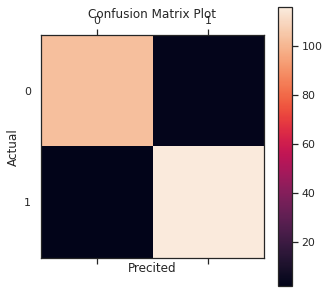

AUC: 0.996


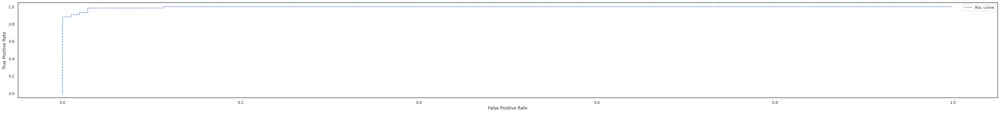

TESTING ON THE DF df_6


Accuracy for KNNis 0.8484848484848485
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for Treeis 0.9212121212121213
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for RFis 0.9575757575757575
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for SVMis 0.9757575757575757
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for XGBis 0.9212121212121213
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model KNN are (Index(['Q164', 'Q109', 'Q81', 'Q178', 'Q9', 'Q96', 'Q146', 'Q36', 'Q54',
       'Q209', 'Q102', 'Q108', 'Q135', 'Q111', 'Q77', 'Q196', 'Q62', 'Q143',
       'Q198', 'Q101', 'Q11', 'Q84', 'Q44', 'Q171', 'Q210', 'Q133', 'Q128',
       'Q39', 'Q23', 'Q155', 'Q176', 'Q123', 'Q31', 'Q183', 'Q205', 'Q95',
       'Q211', 'Q152', 'Q153', 'Q2', 'Q127', 'Q68', 'Q185', 'Q24', 'Q116'],
      dtype='object'), array([0.01927273, 0.01830303, 0.01830303, 0.01793939, 0.01769697,
       0.01745455, 0.0169697 , 0.01684848, 0.01648485, 0.01648485,
       0.01612121, 0.016     , 0.01551515, 0.01527273, 0.01490909,
       0.01478788, 0.01478788, 0.01454545, 0.01454545, 0.01442424,
       0.01430303, 0.01418182, 0.01406061, 0.01406061, 0.01381818,
       0.01369697, 0.01369697, 0.01333333, 0.01333333, 0.01309091,
       0.01309091, 0.0129697 , 0.01284848, 0.01272727, 0.01260606,
       0.01248485, 0.01236364, 0.01224242, 0.01224242, 0.01212121,
       0.012     

Results of the permutation with model Tree are (Index(['Q192', 'Q2', 'Q96', 'Q57', 'Q58', 'Q80', 'Q79', 'Q78', 'Q77', 'Q76',
       'Q75', 'Q74', 'Q73', 'Q72', 'Q71', 'Q70', 'Q69', 'Q68', 'Q82', 'Q67',
       'Q66', 'Q65', 'Q64', 'Q63', 'Q62', 'Q61', 'Q60', 'Q59', 'Q81', 'Q220',
       'Q55', 'Q83', 'Q107', 'Q106', 'Q105', 'Q104', 'Q103', 'Q102', 'Q101',
       'Q100', 'Q99', 'Q98', 'Q97', 'Q95', 'Q94'],
      dtype='object'), array([0.17187879, 0.09406061, 0.064     , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.

Results of the permutation with model RF are (Index(['Q112', 'Q2', 'Q36', 'Q64', 'Q111', 'Q28', 'Q19', 'Q42', 'Q173', 'Q204',
       'Q72', 'Q171', 'Q172', 'Q15', 'Q170', 'Q9', 'Q133', 'Q197', 'Q190',
       'Q31', 'Q187', 'Q119', 'Q106', 'Q56', 'Q37', 'Q81', 'Q29', 'Q183',
       'Q57', 'Q44', 'Q87', 'Q217', 'Q78', 'Q203', 'Q54', 'Q199', 'Q11', 'Q69',
       'Q163', 'Q154', 'Q153', 'Q177', 'Q215', 'Q92', 'Q124'],
      dtype='object'), array([0.00933333, 0.00654545, 0.00618182, 0.00581818, 0.00533333,
       0.00533333, 0.00521212, 0.00509091, 0.00484848, 0.00484848,
       0.00436364, 0.00424242, 0.00424242, 0.00387879, 0.00375758,
       0.00363636, 0.00351515, 0.00351515, 0.00351515, 0.00339394,
       0.00290909, 0.00290909, 0.00266667, 0.00266667, 0.00266667,
       0.00242424, 0.00230303, 0.00230303, 0.00230303, 0.00230303,
       0.00206061, 0.00206061, 0.00206061, 0.00193939, 0.00193939,
       0.00193939, 0.00181818, 0.00169697, 0.00169697, 0.00145455,
       0.00133333, 0.00

Results of the permutation with model SVM are (Index(['Q2', 'Q111', 'Q35', 'Q96', 'Q32', 'Q155', 'Q215', 'Q87', 'Q160', 'Q57',
       'Q78', 'Q77', 'Q70', 'Q76', 'Q75', 'Q74', 'Q73', 'Q72', 'Q71', 'Q220',
       'Q69', 'Q68', 'Q79', 'Q66', 'Q65', 'Q64', 'Q63', 'Q62', 'Q61', 'Q60',
       'Q59', 'Q67', 'Q82', 'Q80', 'Q95', 'Q106', 'Q105', 'Q104', 'Q103',
       'Q102', 'Q101', 'Q100', 'Q99', 'Q98', 'Q97'],
      dtype='object'), array([0.0049697 , 0.00424242, 0.00266667, 0.00109091, 0.00084848,
       0.00072727, 0.00036364, 0.00024242, 0.00024242, 0.00012121,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0.        , 0.        , 0.        ,
       0.        , 0.        , 0

Accuracy: 0.8484848484848485
Precision: 0.9393939393939394
Recall: 0.7469879518072289


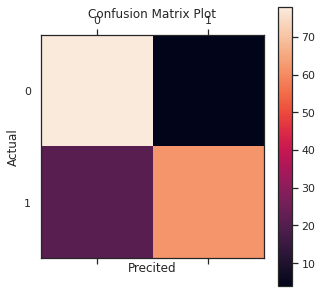

AUC: 0.951


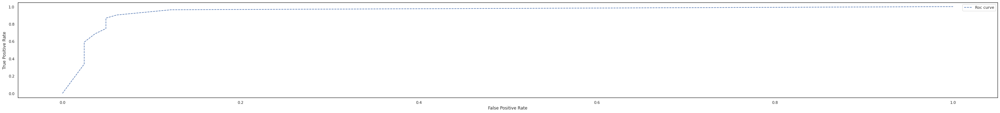

Accuracy: 0.896969696969697
Precision: 0.8837209302325582
Recall: 0.9156626506024096


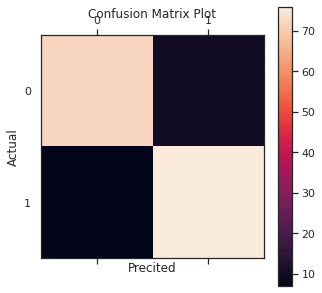

AUC: 0.948


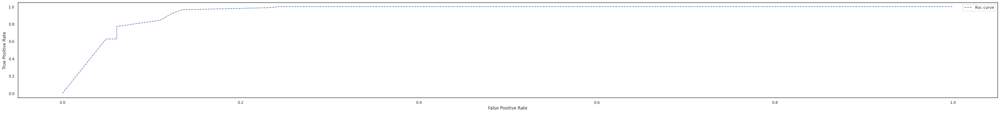

Accuracy: 0.9393939393939394
Precision: 0.9010989010989011
Recall: 0.9879518072289156


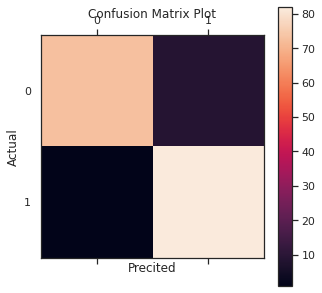

AUC: 0.969


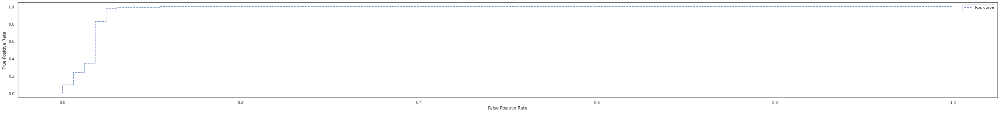

Accuracy: 0.9636363636363636
Precision: 0.963855421686747
Recall: 0.963855421686747


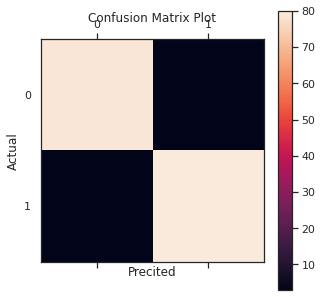

AUC: 0.987


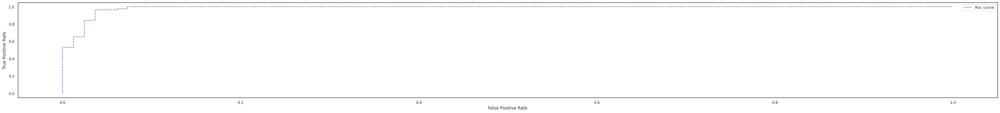

Accuracy: 0.9575757575757575
Precision: 0.9222222222222223
Recall: 1.0


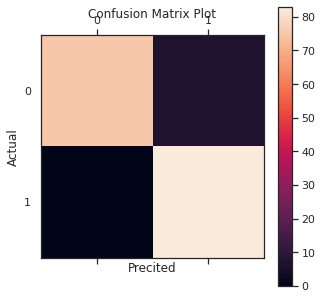

AUC: 0.973


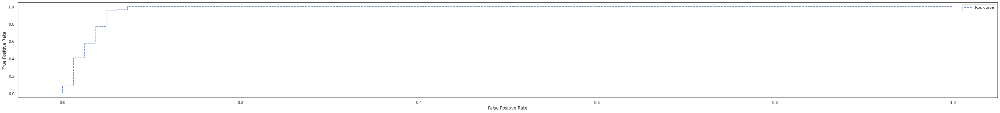

TESTING ON THE DF df_7


Accuracy for KNNis 0.8798076923076923
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for Treeis 0.9038461538461539
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for RFis 0.9567307692307693
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for SVMis 0.9182692307692307
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for XGBis 0.9182692307692307
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model KNN are (Index(['PID9', 'PID12', 'PID19', 'PID24', 'PID8', 'PID17'], dtype='object'), array([-0.00653846, -0.02192308, -0.02605769, -0.02836538, -0.02932692,
       -0.03086538]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model Tree are (Index(['PID9', 'PID8', 'PID24', 'PID19', 'PID5', 'PID13'], dtype='object'), array([0.11625   , 0.06538462, 0.05894231, 0.04509615, 0.04480769,
       0.02298077]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model RF are (Index(['PID9', 'PID24', 'PID12', 'PID8', 'PID21', 'PID17'], dtype='object'), array([0.03942308, 0.02240385, 0.01355769, 0.01      , 0.00798077,
       0.00336538]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model SVM are (Index(['PID9', 'PID8', 'PID21', 'PID24', 'PID15', 'PID17'], dtype='object'), array([0.07298077, 0.02913462, 0.02538462, 0.02134615, 0.01932692,
       0.01557692]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy: 0.8365384615384616
Precision: 0.8617021276595744
Recall: 0.7941176470588235


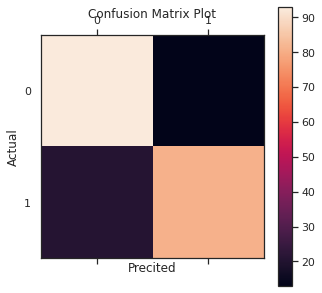

AUC: 0.923


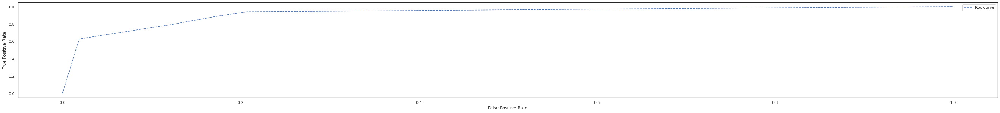

Accuracy: 0.9086538461538461
Precision: 0.8952380952380953
Recall: 0.9215686274509803


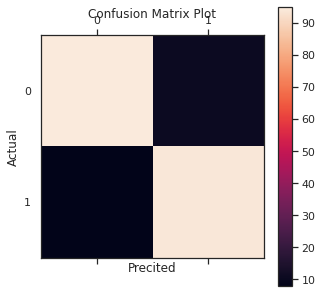

AUC: 0.960


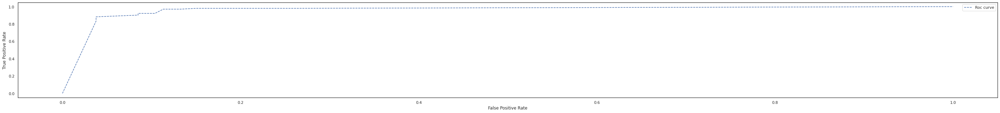

Accuracy: 0.9567307692307693
Precision: 0.9345794392523364
Recall: 0.9803921568627451


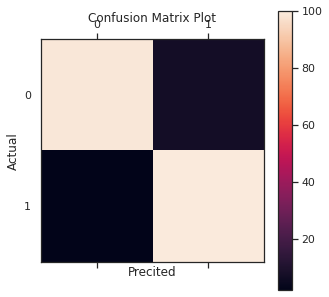

AUC: 0.985


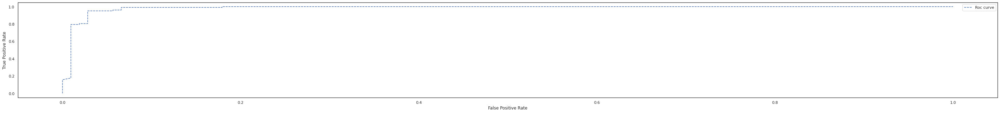

Accuracy: 0.8990384615384616
Precision: 0.9090909090909091
Recall: 0.8823529411764706


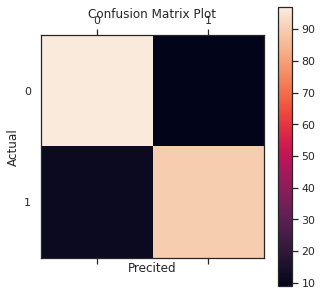

AUC: 0.960


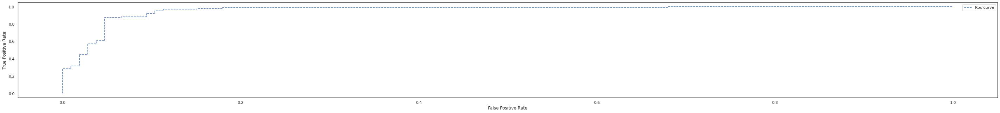

Accuracy: 0.9423076923076923
Precision: 0.9245283018867925
Recall: 0.9607843137254902


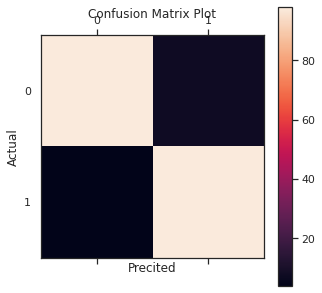

AUC: 0.973


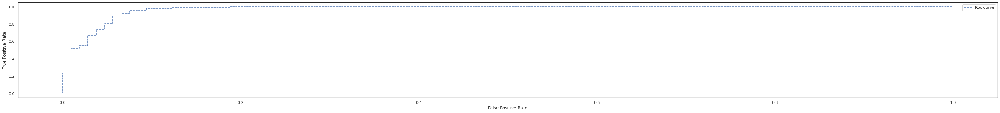

TESTING ON THE DF df_8


Accuracy for KNNis 0.8455882352941176
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for Treeis 0.8382352941176471
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for RFis 0.9044117647058824
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for SVMis 0.7867647058823529
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for XGBis 0.8970588235294118
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model KNN are (Index(['PreM3', 'IC6', 'C1', 'C6'], dtype='object'), array([0.05058824, 0.03897059, 0.02926471, 0.02647059]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model Tree are (Index(['PreM3', 'PreM5', 'PreM2', 'IC1'], dtype='object'), array([0.17029412, 0.04088235, 0.04073529, 0.02014706]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model RF are (Index(['PreM3', 'PreM5', 'IC1', 'PreM4'], dtype='object'), array([0.03014706, 0.0025    , 0.00117647, 0.00117647]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model SVM are (Index(['PreM3', 'C3', 'C4', 'C6'], dtype='object'), array([0.02779412, 0.01426471, 0.00911765, 0.00544118]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy: 0.8455882352941176
Precision: 0.9230769230769231
Recall: 0.7894736842105263


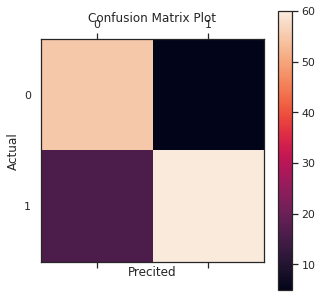

AUC: 0.916


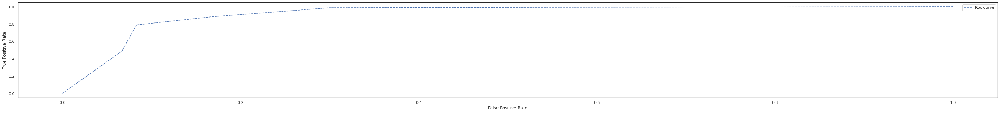

Accuracy: 0.875
Precision: 0.8831168831168831
Recall: 0.8947368421052632


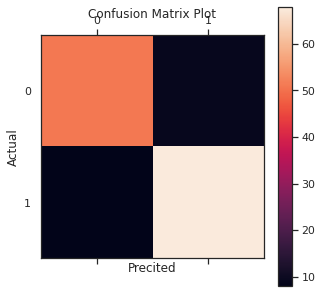

AUC: 0.889


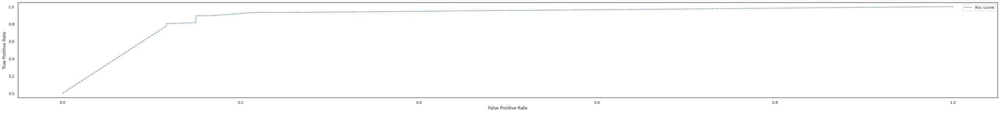

Accuracy: 0.9044117647058824
Precision: 0.9090909090909091
Recall: 0.9210526315789473


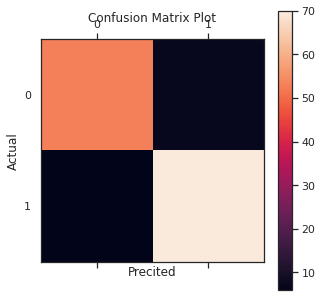

AUC: 0.965


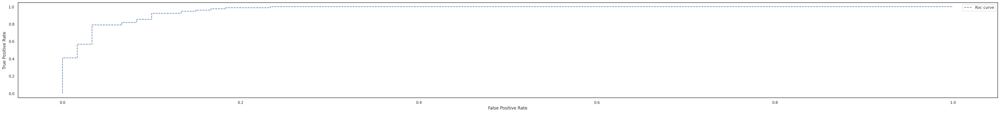

Accuracy: 0.7941176470588235
Precision: 0.8870967741935484
Recall: 0.7236842105263158


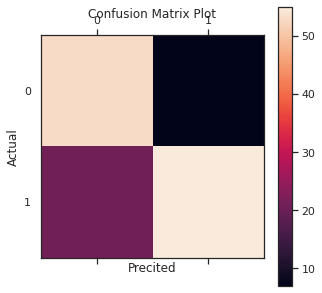

AUC: 0.928


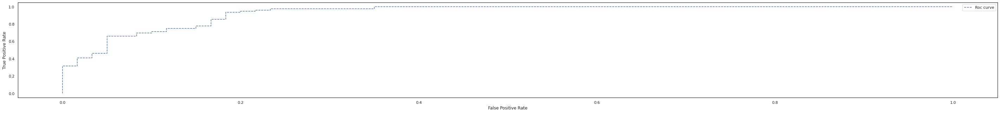

Accuracy: 0.9044117647058824
Precision: 0.9090909090909091
Recall: 0.9210526315789473


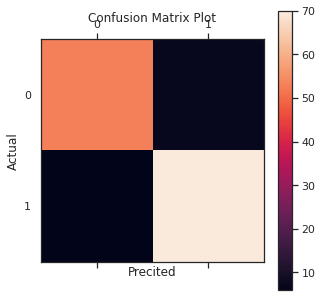

AUC: 0.958


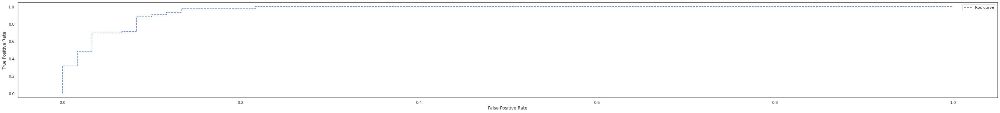

In [ ]:
for df in[df_1,df_2,df_3,df_4,df_5,df_6,df_7,df_8]:
  print("TESTING ON THE DF {}".format(get_var_name(df)[0]))
  #splitting and scaling (with standard scaler)
  X, y, X_train , X_test, y_train , y_test = split(df) 

  #testing the selection function  
  #s = selection(type, df) #PCA SelectKBest LASSO VAR_SEL
  op.logging.set_verbosity(op.logging.CRITICAL)
  df = df
  for model in ["KNN","Tree","RF","SVM","XGB"]:
      m = modelling(model,X_train, X_test, y_train, y_test, hyper = None,  tuning = True, flow = False , n = 3)[0]
      m.fit(X_train,y_train)
      y_pred = m.predict(X_test)
      print('Accuracy for {}'.format(model)+'is {}'.format(accuracy_score(y_test, y_pred)))
      print("----------------------------------------------------------------------------------------------------------------------------------------------------------")
  for s in ["KNN","Tree","RF","SVM"]:
      model = modelling(s,X_train, X_test, y_train, y_test, hyper = None,  tuning = True, flow = False, n = 3)[0]
      perm = permutation_imp(model, df, perc_items=0.2)
      print("Results of the permutation with model {} are {}".format(s,perm))
      print("----------------------------------------------------------------------------------------------------------------------------------------------------------")

  for model in ["KNN","Tree","RF","SVM","XGB"]:
      y_test, y_pred, y_prob = modelling(model,X_train, X_test, y_train, y_test, hyper = None,  tuning = True, flow = True , n = 3)
      eval = evaluation(y_test,y_pred, y_prob = y_prob)


### Testing the modelling function on df_10

In [ ]:
for df in df_list_10: 
  print("TESTING ON THE DF {}".format(get_var_name(df)[0]))
  #splitting and scaling (with standard scaler)
  X, y, X_train , X_test, y_train , y_test = split(df) 

  #testing the selection function  
  #s = selection(type, df) #PCA SelectKBest LASSO VAR_SEL
  op.logging.set_verbosity(op.logging.CRITICAL)

  for model in ["KNN","Tree","RF","SVM","XGB"]:

    m = modelling(model,X_train, X_test, y_train, y_test, hyper = None,  tuning = True, flow = False , n = 3)[0]
    m.fit(X_train,y_train)
    y_pred = m.predict(X_test)
    print('Accuracy for {}'.format(model)+'is {}'.format(accuracy_score(y_test, y_pred)))
    print("----------------------------------------------------------------------------------------------------------------------------------------------------------")
    
    #testing the permutation importance feature selection
    #perm = permutation_imp(m, df, perc_items=0.2)
    #print("Results of the permutation with model {} are {}".format(s,perm))
    #print("----------------------------------------------------------------------------------------------------------------------------------------------------------")

  for s in ["KNN","Tree","RF","SVM"]:
    model = modelling(s,X_train, X_test, y_train, y_test, hyper = None,  tuning = True, flow = False, n = 3)[0]
    perm = permutation_imp(model, df, perc_items=0.2)
    print("Results of the permutation with model {} are {}".format(s,perm))
    print("----------------------------------------------------------------------------------------------------------------------------------------------------------")
    
  for model in ["KNN","Tree","RF","SVM","XGB"]:
    y_test, y_pred, y_prob = modelling(model,X_train, X_test, y_train, y_test, hyper = None,  tuning = True, flow = True , n = 3)
    eval = evaluation(y_test,y_pred, y_prob = y_prob)

  sns.set(rc={'figure.figsize':(50,5)})
  df_long = df.melt(id_vars=['CONDITION'], value_vars=list(df.columns))
  sns.set_style('white')
  ax = sns.violinplot(data=df_long.iloc[:, :10], x='variable', y='value', hue='CONDITION', split=True, palette='flare')
  ax.legend()
  sns.despine()
  plt.tight_layout()
  plt.show()


TESTING ON THE DF df_10


Accuracy for KNNis 0.8945166688119449
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for Treeis 0.871669455528382
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for RFis 0.9052001544600334
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for SVMis 0.9151113399407903
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for XGBis 0.9043634959454241
----------------------------------------------------------------------------------------------------------------------------------------------------------


### Testing modelling function from df_9, df_11, df_12, df_13

TESTING ON THE DF df_9


Accuracy for KNNis 0.75
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for Treeis 0.8194444444444444
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for RFis 0.9305555555555556
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for SVMis 0.9305555555555556
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for XGBis 0.8472222222222222
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model KNN are (Index(['IESR5', 'IESR1', 'IESR17', 'IESR2', 'IESR12'], dtype='object'), array([0.03861111, 0.02055556, 0.01      , 0.00972222, 0.00388889]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model Tree are (Index(['IESR11', 'IESR9', 'IESR19', 'IESR10', 'IESR7'], dtype='object'), array([0.08916667, 0.06777778, 0.05055556, 0.04027778, 0.01694444]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model RF are (Index(['IESR9', 'IESR19', 'IESR20', 'IESR5', 'IESR15'], dtype='object'), array([0.05777778, 0.04694444, 0.02861111, 0.01944444, 0.01888889]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model SVM are (Index(['IESR3', 'IESR5', 'IESR9', 'IESR19', 'IESR15'], dtype='object'), array([0.06805556, 0.06777778, 0.04      , 0.03638889, 0.0275    ]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy: 0.7777777777777778
Precision: 0.9583333333333334
Recall: 0.6052631578947368


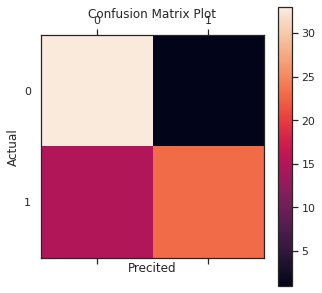

AUC: 0.842


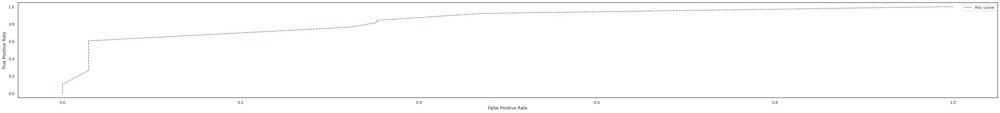

Accuracy: 0.8194444444444444
Precision: 0.8378378378378378
Recall: 0.8157894736842105


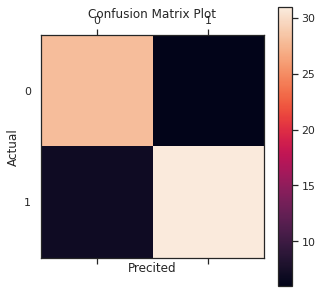

AUC: 0.873


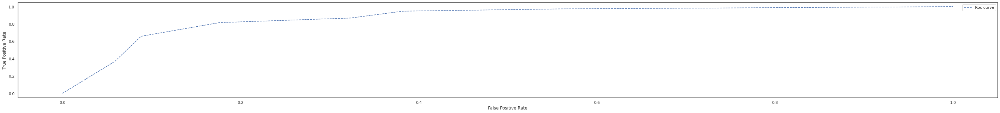

Accuracy: 0.9444444444444444
Precision: 0.9047619047619048
Recall: 1.0


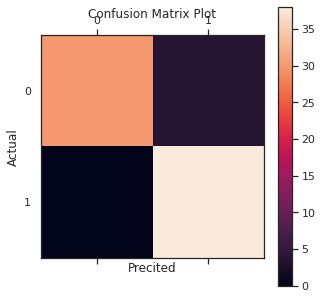

AUC: 0.943


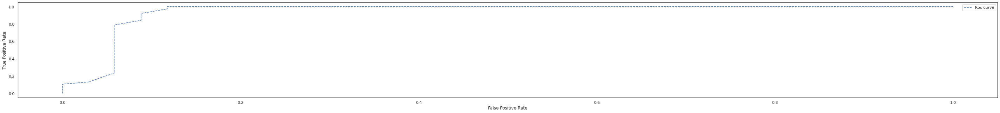

Accuracy: 0.9305555555555556
Precision: 0.9230769230769231
Recall: 0.9473684210526315


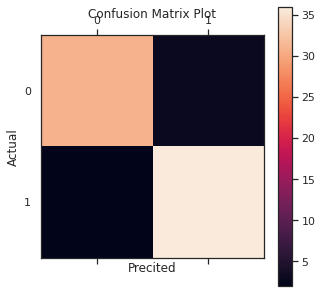

AUC: 0.931


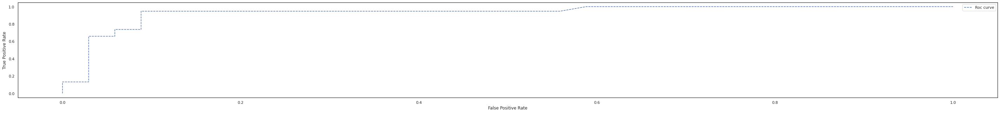

Accuracy: 0.9166666666666666
Precision: 0.9210526315789473
Recall: 0.9210526315789473


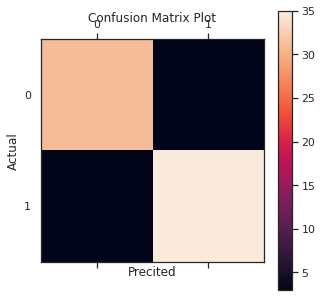

AUC: 0.951


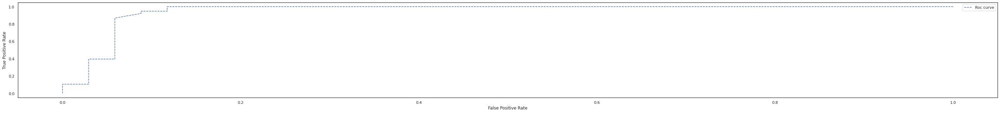

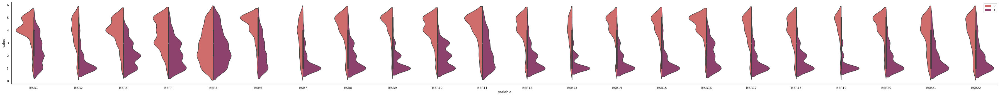

TESTING ON THE DF df_11


Accuracy for KNNis 0.7323232323232324
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for Treeis 0.7323232323232324
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for RFis 0.7929292929292929
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for SVMis 0.7323232323232324
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for XGBis 0.7828282828282829
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model KNN are (Index(['P1', 'P3', 'P5'], dtype='object'), array([0.10949495, 0.04282828, 0.04181818]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model Tree are (Index(['P1', 'N12', 'M11'], dtype='object'), array([0.13010101, 0.04777778, 0.03262626]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model RF are (Index(['P1', 'N12', 'M11'], dtype='object'), array([0.09464646, 0.03626263, 0.03565657]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model SVM are (Index(['P1', 'P3', 'N12'], dtype='object'), array([0.13424242, 0.01686869, 0.01606061]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy: 0.7171717171717171
Precision: 0.7654320987654321
Recall: 0.6262626262626263


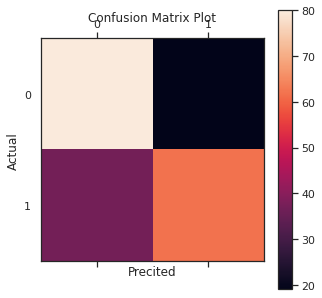

AUC: 0.781


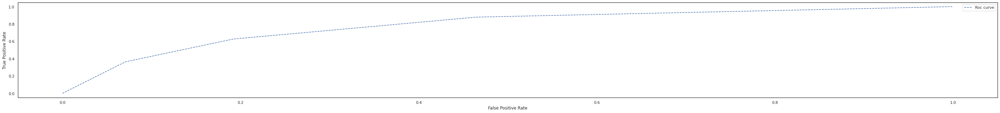

Accuracy: 0.7525252525252525
Precision: 0.7358490566037735
Recall: 0.7878787878787878


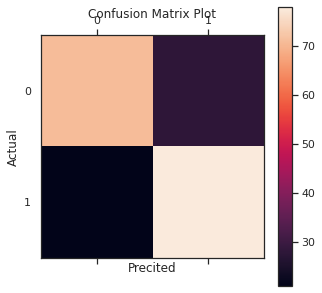

AUC: 0.818


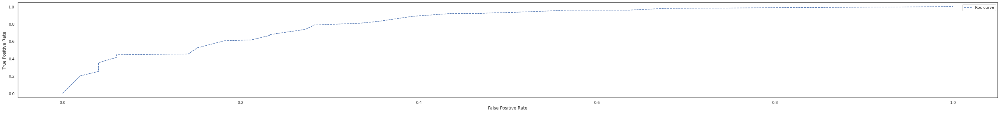

Accuracy: 0.797979797979798
Precision: 0.8041237113402062
Recall: 0.7878787878787878


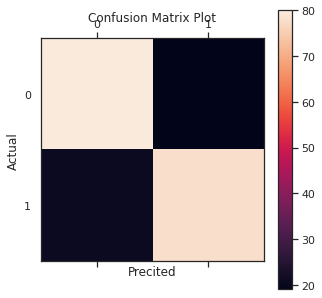

AUC: 0.863


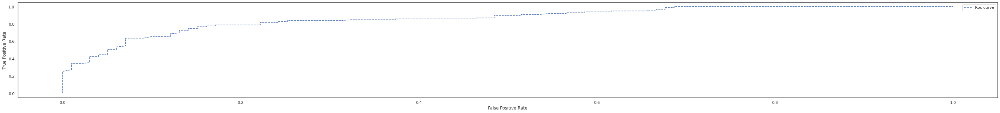

Accuracy: 0.7272727272727273
Precision: 0.7368421052631579
Recall: 0.7070707070707071


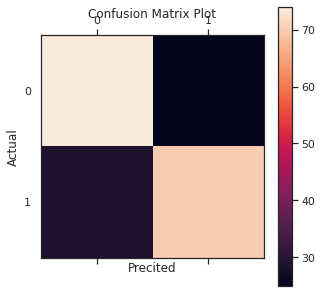

AUC: 0.806


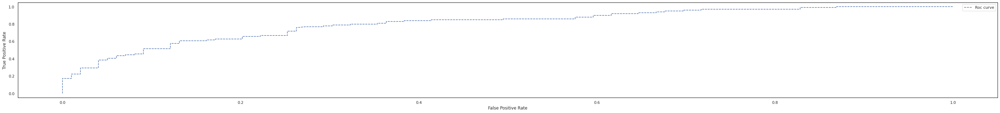

Accuracy: 0.7626262626262627
Precision: 0.75
Recall: 0.7878787878787878


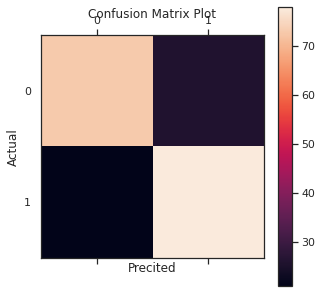

AUC: 0.823


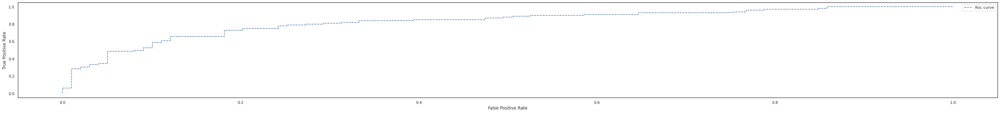

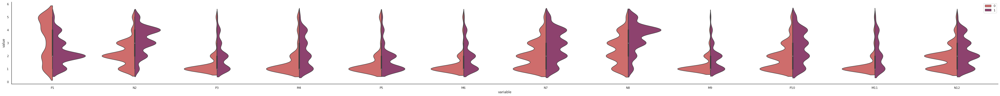

TESTING ON THE DF df_12


Accuracy for KNNis 0.7111111111111111
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for Treeis 0.7444444444444445
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for RFis 0.7555555555555555
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for SVMis 0.7444444444444445
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for XGBis 0.5222222222222223
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model KNN are (Index(['Pr2', 'FI2'], dtype='object'), array([0.04911111, 0.03222222]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model Tree are (Index(['FI3', 'Pr2'], dtype='object'), array([0.10555556, 0.06      ]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model RF are (Index(['FI3', 'Pr1'], dtype='object'), array([0.05488889, 0.03022222]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model SVM are (Index(['FI1', 'FA1'], dtype='object'), array([0.04111111, 0.03644444]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy: 0.7222222222222222
Precision: 0.8235294117647058
Recall: 0.5957446808510638


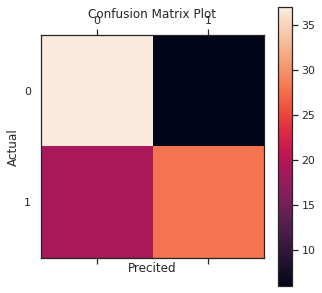

AUC: 0.791


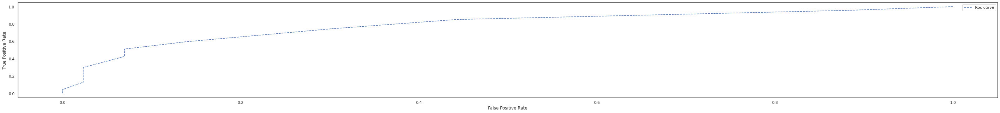

Accuracy: 0.7333333333333333
Precision: 0.7555555555555555
Recall: 0.723404255319149


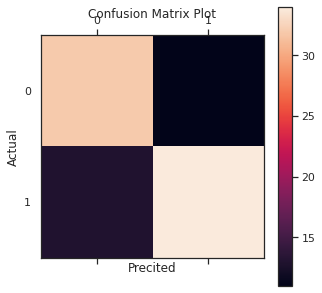

AUC: 0.720


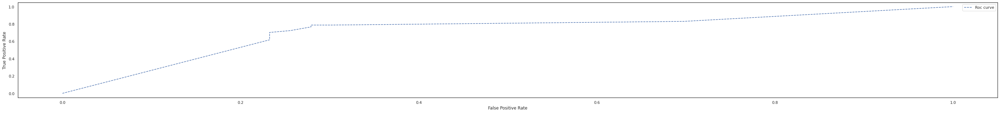

Accuracy: 0.7666666666666667
Precision: 0.7708333333333334
Recall: 0.7872340425531915


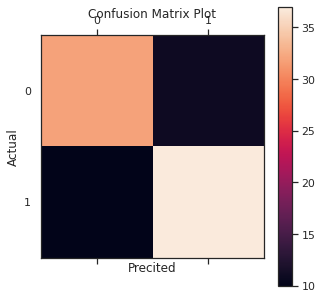

AUC: 0.840


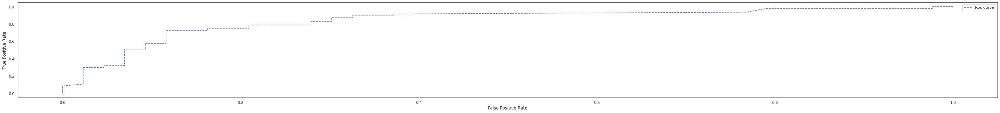

Accuracy: 0.7333333333333333
Precision: 0.7804878048780488
Recall: 0.6808510638297872


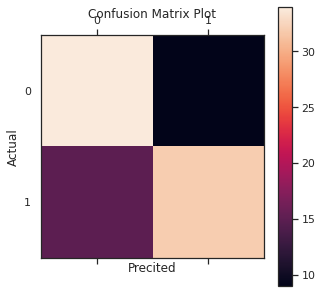

AUC: 0.833


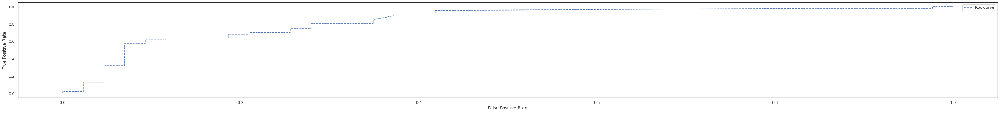

Accuracy: 0.7333333333333333
Precision: 0.7446808510638298
Recall: 0.7446808510638298


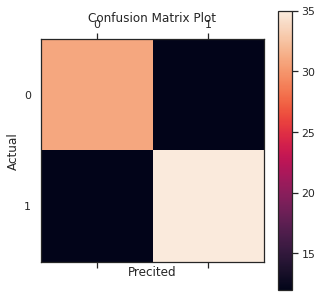

AUC: 0.756


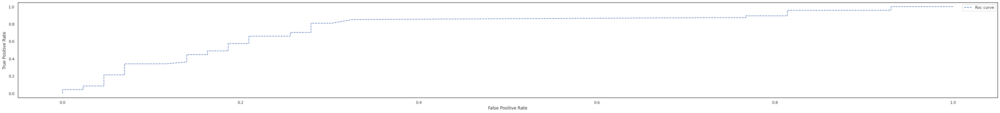

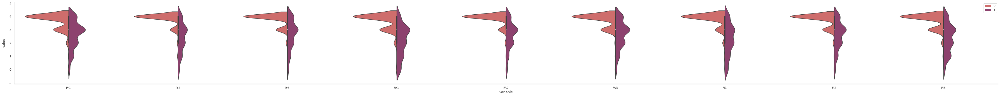

TESTING ON THE DF df_13


Accuracy for KNNis 0.8489208633093526
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for Treeis 0.7913669064748201
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for RFis 0.8381294964028777
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for SVMis 0.8093525179856115
----------------------------------------------------------------------------------------------------------------------------------------------------------


Accuracy for XGBis 0.8741007194244604
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model KNN are (Index(['ES1G', 'ES2G', 'C1G'], dtype='object'), array([0.09769784, 0.06827338, 0.06230216]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


Results of the permutation with model Tree are (Index(['C2G', 'C1G', 'ES2G'], dtype='object'), array([0.10625899, 0.06136691, 0.06071942]))
----------------------------------------------------------------------------------------------------------------------------------------------------------


In [ ]:
for df in [df_9, df_11, df_12, df_13]:
  print("TESTING ON THE DF {}".format(get_var_name(df)[0]))
  #splitting and scaling (with standard scaler)
  X, y, X_train , X_test, y_train , y_test = split(df) 

  #testing the selection function  
  #s = selection(type, df) #PCA SelectKBest LASSO VAR_SEL
  op.logging.set_verbosity(op.logging.CRITICAL)
  df = df
  for model in ["KNN","Tree","RF","SVM","XGB"]:
      m = modelling(model,X_train, X_test, y_train, y_test, hyper = None,  tuning = True, flow = False , n = 3)[0]
      m.fit(X_train,y_train)
      y_pred = m.predict(X_test)
      print('Accuracy for {}'.format(model)+'is {}'.format(accuracy_score(y_test, y_pred)))
      print("----------------------------------------------------------------------------------------------------------------------------------------------------------")
  for s in ["KNN","Tree","RF","SVM"]:
      model = modelling(s,X_train, X_test, y_train, y_test, hyper = None,  tuning = True, flow = False, n = 3)[0]
      perm = permutation_imp(model, df, perc_items=0.2)
      print("Results of the permutation with model {} are {}".format(s,perm))
      print("----------------------------------------------------------------------------------------------------------------------------------------------------------")

  for model in ["KNN","Tree","RF","SVM","XGB"]:
      y_test, y_pred, y_prob = modelling(model,X_train, X_test, y_train, y_test, hyper = None,  tuning = True, flow = True , n = 3)
      eval = evaluation(y_test,y_pred, y_prob = y_prob)

  sns.set(rc={'figure.figsize':(50,5)})
  df_long = df.melt(id_vars=['CONDITION'], value_vars=list(df.columns))
  sns.set_style('white')
  ax = sns.violinplot(data=df_long.iloc[:, :10], x='variable', y='value', hue='CONDITION', split=True, palette='flare')
  ax.legend()
  sns.despine()
  plt.tight_layout()
  plt.show()



##Testing selection function 

In [ ]:
for df in [df_1, df_2, df_3, df_4, df_5, df_6, df_7, df_8, df_9, df_10, df_11, df_12, df_13]:
  
  #----------------------------------------------------------------------------------------
  # For the sake of simplicity, only the selected features are printed!
  # THE TYPE FOR LASSO HAS CHANGE TO TWO DIFFERENT MODELS: 1. LOGISTIC_LASSO, 2. SVM_LASSO
  # n is the 20 percent of features.
  #----------------------------------------------------------------------------------------
  
  n = int(np.floor(len(df.columns) / 5))
  for s_type in ['PCA', 'SelectKBest','SVM_LASSO', 
                 'LOGISTIC_LASSO','VAR_SEL','TAR_SEL']:

    if s_type == 'PCA':
      principal_df = selection(s_type, df)
      print("DataFrame {} with selection {} has the results:".format(get_var_name(df)[0],s_type))
      print(principal_df)

    else:
      _,_, selected_features_k = selection(s_type, df, n = n)
      print("DataFrame {} with selection {} has the results:".format(get_var_name(df)[0],s_type))
      print(selected_features_k)

    print("----------------------------------------------------------------------------------------------")

PCA Explainded variance ratio [0.20435508 0.10295196 0.07348448 0.05151618 0.04611663]
DataFrame df_1 with selection PCA has the results:
      principal component 1  principal component 2  principal component 3  \
0                 -3.299168               2.755168              -0.903498   
1                 -0.612019               1.603261              -2.127566   
2                 -1.892061               1.062838              -0.672365   
3                  3.122176              -2.025978               1.152410   
4                  0.240408               0.765019               1.237344   
...                     ...                    ...                    ...   
1341               1.581545               0.309855              -0.982197   
1342              -2.595356              -2.010073              -0.008318   
1343              -4.456487              -2.500040               0.341026   
1344              -1.580108               0.770191              -0.827240   
1345           

Thank you for your attention. The end.